In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from os.path import join
import os

import DataLoader
import network

from train import training
from test import testing
from utils import utils

# JTA Exploration

In [2]:
class args():
    def __init__(self, dtype):
        self.dataset = '/home/yju/JTA/preprocessed_annotations' #folder containing parsed jaad annotations (used when first time loading data)
        self.dtype        = dtype
        self.from_file    = True #read dataset from csv file or reprocess data
        self.save         = True
        self.is_3d        = True
        self.output_path   = '/home/yju/JTA'
        self.model_name    = 'model_1e-05_512.pkl'
        self.model_path    = join(self.output_path, self.model_name)
        self.loader_workers = 12
        self.loader_shuffle = False # for visualization set to false
        self.pin_memory     = False
        self.image_resize   = [240, 426]
        self.device         = 'cuda'
        self.batch_size     = 128 # 32, 64
        self.n_epochs       = 100
        self.hidden_size    = 512
        self.hardtanh_limit = 100
        self.input  = 16
        self.output = 16
        self.stride = 16
        self.skip   = 1
        self.task   = 'bounding_box'
        self.use_scenes = False      
        self.lr = 0.001 # inc lr 0.00001
        self.filename     = 'jta_{}_{}_{}_{}.csv'.format(str(self.dtype), str(self.input),\
                            str(self.output), str(self.stride)) 
        self.save_path = join(self.output_path, self.filename)

In [3]:
# load data
train = DataLoader.data_loader(args(dtype='train'), data='JTA')  
val = DataLoader.data_loader(args(dtype='val'), data='JTA') 
test = DataLoader.data_loader(args('test'), data='JTA') 

Loading train data ...
ID loaded
bounding_box loaded
future_bounding_box loaded
scenefolderpath loaded
filename loaded
mask loaded
(449585, 6)
train set loaded
******************************
Loading val data ...
ID loaded
bounding_box loaded
future_bounding_box loaded
scenefolderpath loaded
filename loaded
mask loaded
(224101, 6)
val set loaded
******************************
Loading test data ...
ID loaded
bounding_box loaded
future_bounding_box loaded
scenefolderpath loaded
filename loaded
mask loaded
(221386, 6)
test set loaded
******************************


In [4]:
train.dataset.data.bounding_box[0]

[[5.175, -8.29, 27.53, 0.539, 1.748, 0.836],
 [5.185, -8.29, 27.535, 0.561, 1.748, 0.825],
 [5.19, -8.29, 27.535, 0.572, 1.748, 0.825],
 [5.2, -8.295, 27.545, 0.594, 1.7595, 0.825],
 [5.21, -8.295, 27.545, 0.594, 1.7595, 0.803],
 [5.215, -8.295, 27.55, 0.605, 1.7595, 0.814],
 [5.215, -8.295, 27.55, 0.605, 1.7595, 0.814],
 [5.22, -8.295, 27.55, 0.616, 1.7595, 0.814],
 [5.215, -8.295, 27.55, 0.627, 1.7595, 0.814],
 [5.22, -8.295, 27.555, 0.638, 1.7595, 0.803],
 [5.215, -8.295, 27.555, 0.627, 1.7595, 0.803],
 [5.215, -8.295, 27.555, 0.627, 1.7595, 0.803],
 [5.21, -8.295, 27.55, 0.616, 1.7595, 0.814],
 [5.21, -8.295, 27.55, 0.616, 1.7595, 0.814],
 [5.2, -8.295, 27.545, 0.594, 1.7595, 0.825],
 [5.195, -8.285, 27.545, 0.583, 1.7595, 0.825]]

In [5]:
val.dataset.data.scenefolderpath[0]

['/work/vita/JTA_dataset/Original_JTA_dataset/frames/val/seq_281']

In [6]:
# Make new output path
path = '/home/yju/JTA/data'
custom_name = 'final'
if not os.path.isdir(os.path.join(path, custom_name)):    
    os.mkdir(os.path.join(path, custom_name))
data_path = join(path, custom_name)

## Training

In [ ]:
arg = args(dtype='train')
arg.output_path = data_path
arg.lr = 1e-3
arg.hidden_size = 512
training(arg, train, val, scheduler=True, save=True)

## Testing

In [7]:
arg = args(dtype='train')
arg.output_path = data_path
arg.hidden_size = 512
arg.model_name = 'model_1e-05_512.pkl'
preds_train = testing(arg, train)

Testing ...
vs: 0.0152170 | ade: 0.2360 | fde: 0.4155 | aiou: 0.5626 | fiou: 0.4120 | t:25.5232


In [8]:
arg.dtype = 'val'
preds_val = testing(arg, val)

Testing ...
vs: 0.0260626 | ade: 0.2848 | fde: 0.5084 | aiou: 0.5464 | fiou: 0.3933 | t:13.9073


In [9]:
arg.dtype = 'test'
preds_test = testing(arg, test)

Testing ...
vs: 0.0182705 | ade: 0.2413 | fde: 0.4262 | aiou: 0.5677 | fiou: 0.4195 | t:13.9194


In [10]:
# Get ground truth
df_train = train.dataset.data
df_val = val.dataset.data
df_test = test.dataset.data

pred_test = []
pred_train = []
pred_val = []

size = 200
for i in range(size):
    pred_test.extend(preds_test[i].cpu().detach().numpy())
    pred_train.extend(preds_train[i].cpu().detach().numpy())
    pred_val.extend(preds_val[i].cpu().detach().numpy())

pred_test = np.asarray(pred_test)
pred_train = np.asarray(pred_train)
pred_val = np.asarray(pred_val)

print(pred_test.shape) # gives first 128 predictions, each of length 16 frames with 6 variables each
print(pred_train.shape)
print(pred_val.shape)

(25600, 16, 6)
(25600, 16, 6)
(25600, 16, 6)


## Visualization

In [11]:
from IPython.display import Image as display_gif
from visualization.visualize import visualize

(7, 6)
Plotting pedestrians with pids: [10, 20, 15, 102, 101]


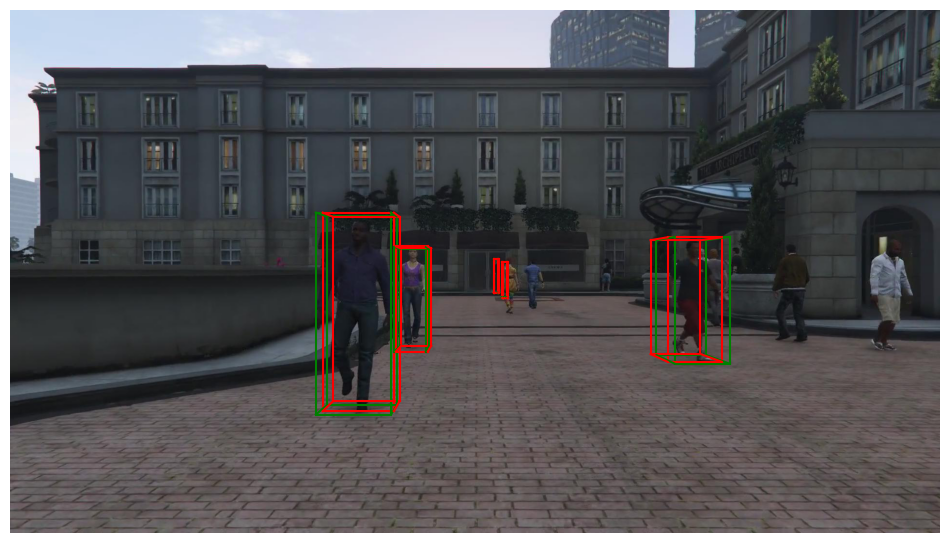

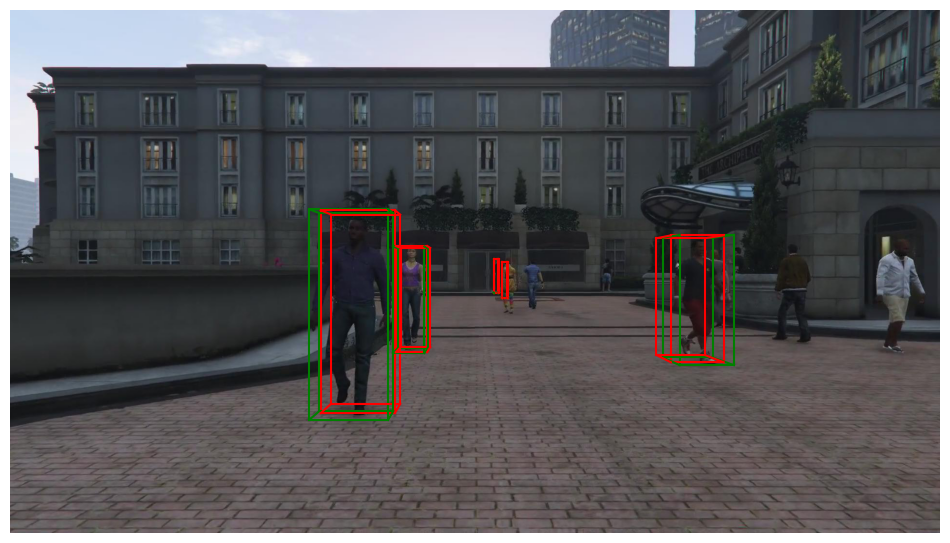

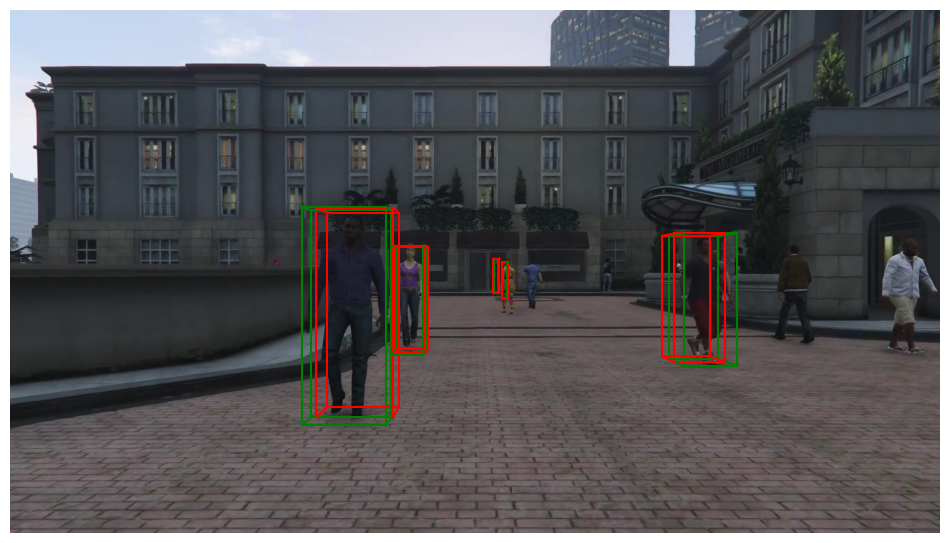

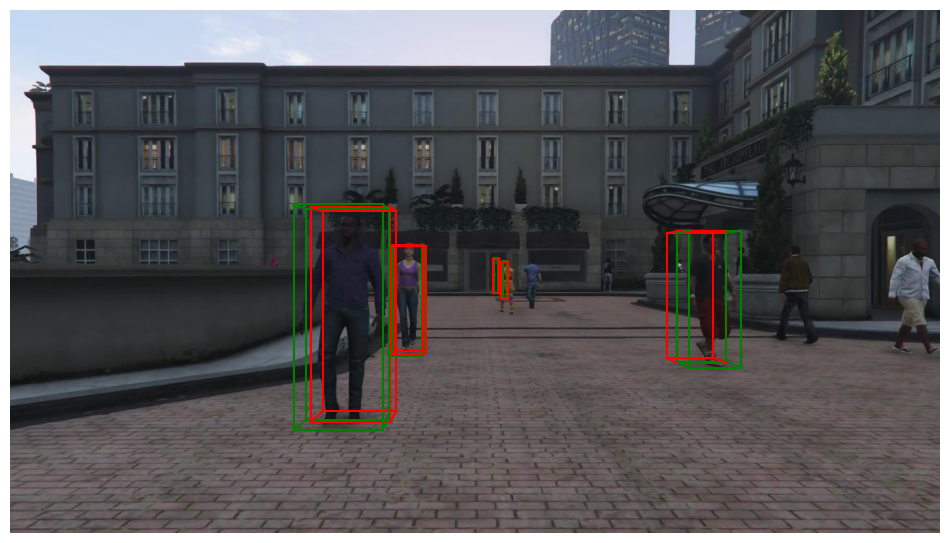

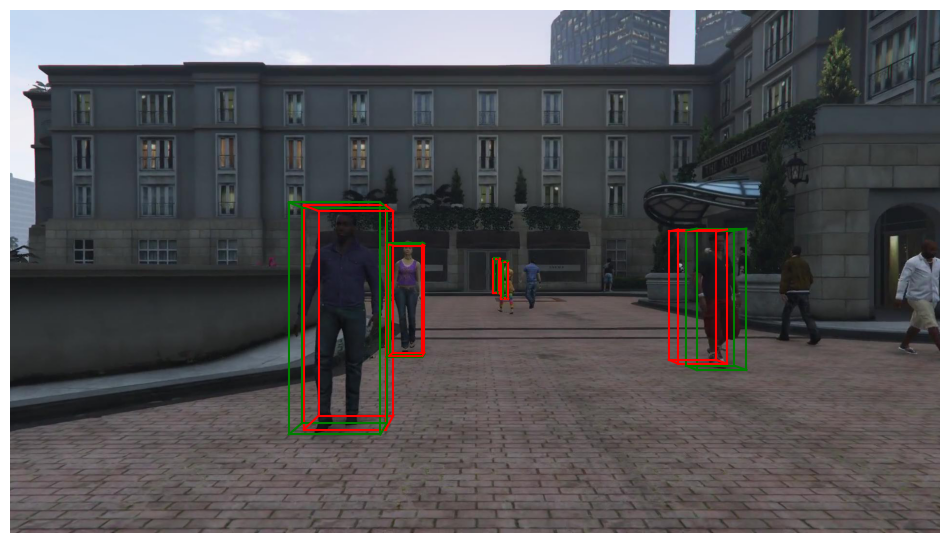

...

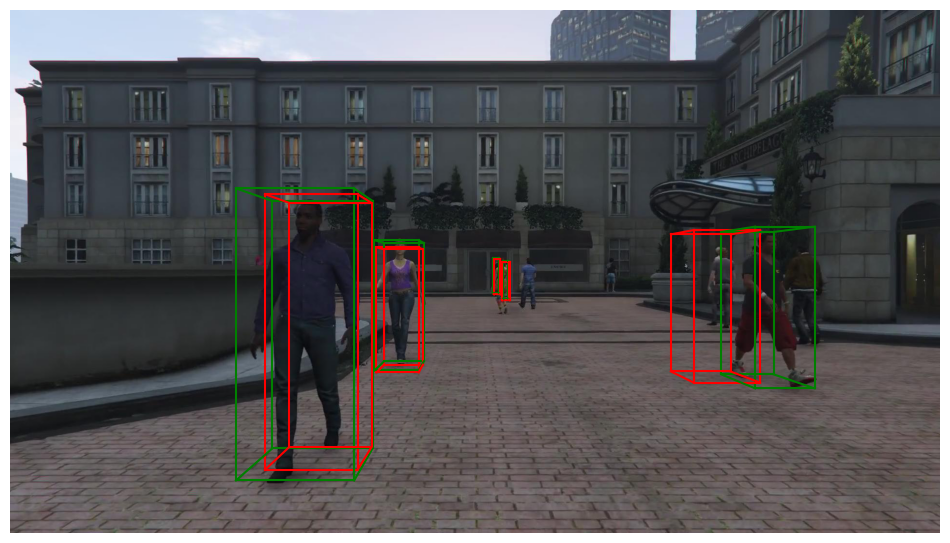

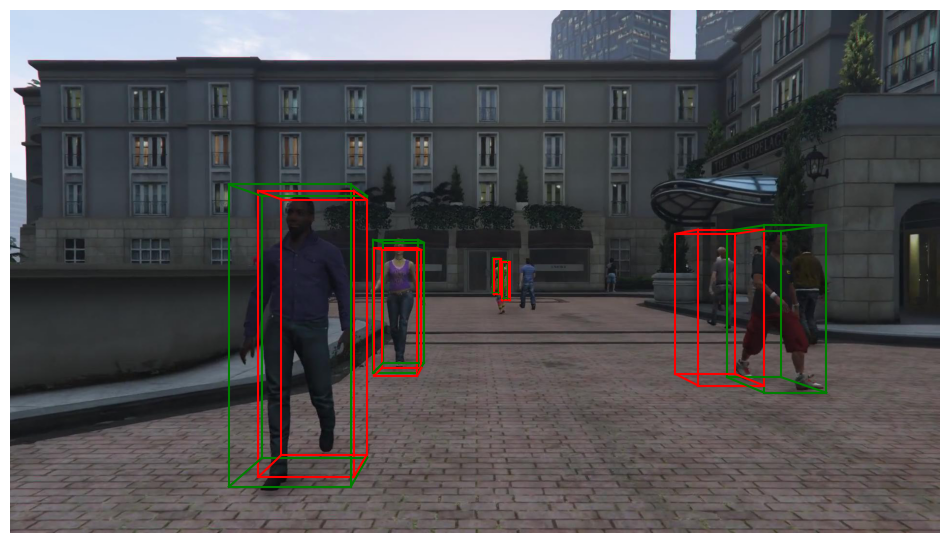

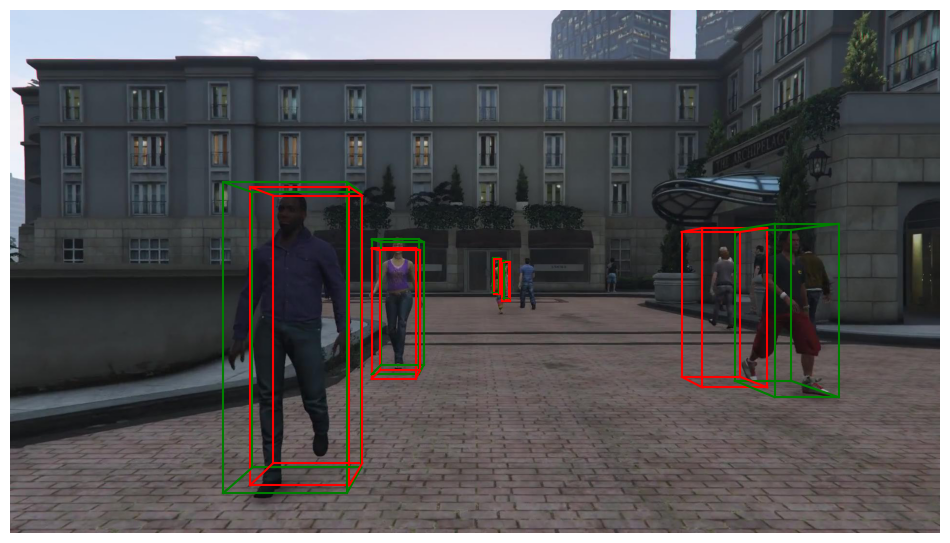

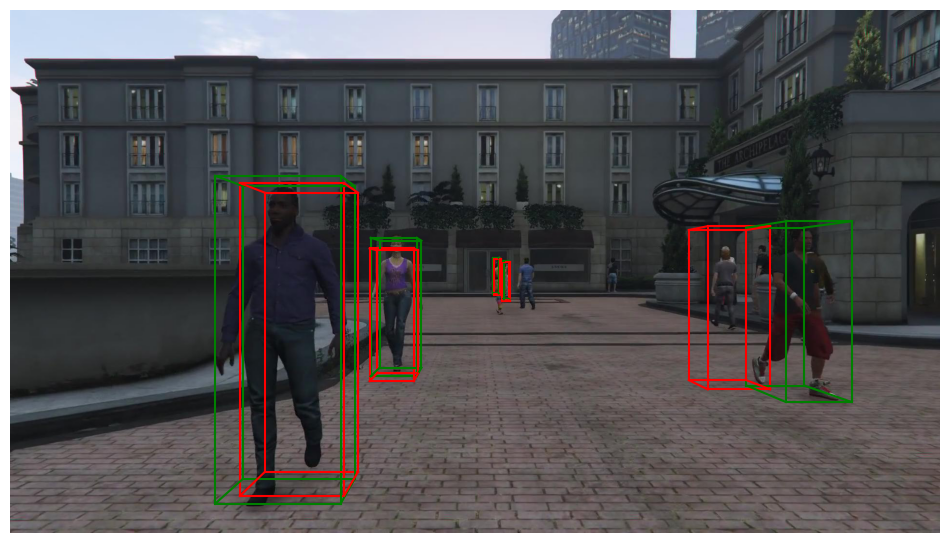

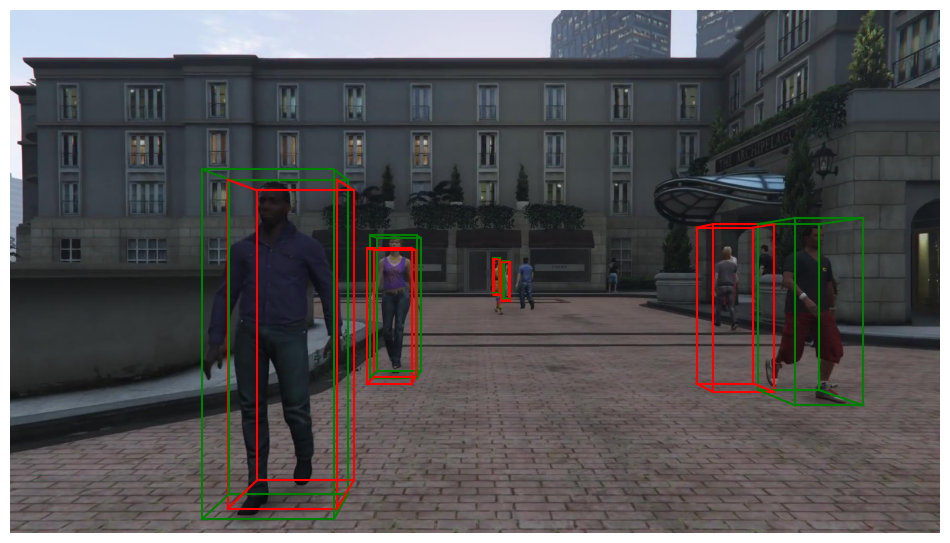

<Figure size 1200x800 with 0 Axes>

In [12]:
vis = visualize('JTA')
idx = 19700
save = False
outpath = '/home/yju/yju_testing/3d-bbox/gifs'
vis.get_gif(idx, df_test, pred_test, args('test'), outpath, save=save)

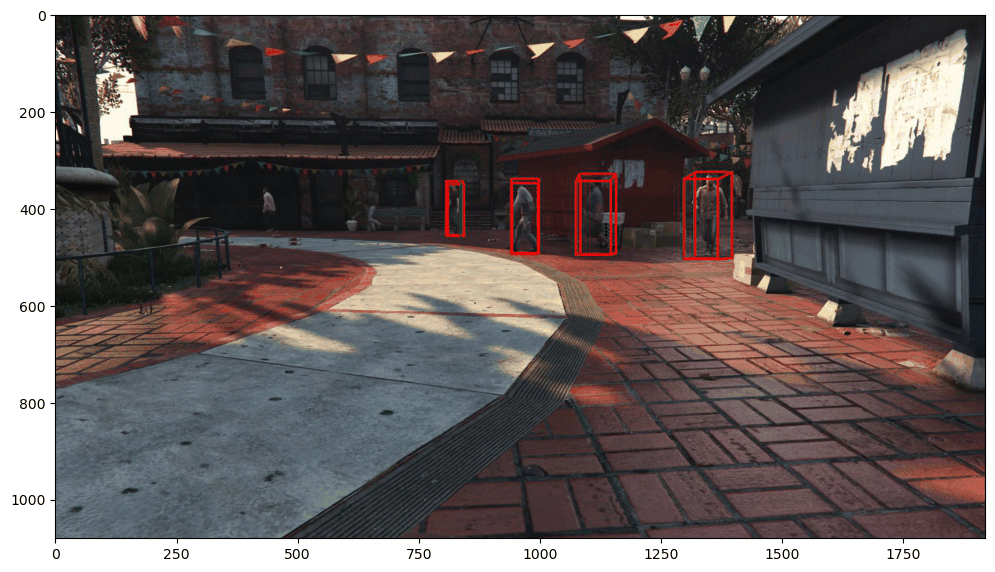

In [25]:
display_gif(join(outpath, "test_seq_412_frame97_idx130.gif")) 

# 3D Visualization

In [39]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection, Line3DCollection
from matplotlib.pyplot import AutoLocator
from visualization.visualize import plot_3d, get_colormap
%matplotlib notebook

In [34]:
path = '/home/yju/JTA/preprocessed_annotations/train'
filename = "seq_195.csv"
df = pd.read_csv(join(path, filename))
df.head(10)

,frame,ID,x,y,z,w,h,d,mask,scenefolderpath,filename
0,1.0,1.0,1.610,0.595,4.100,0.682,1.8285,0.528,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
1,1.0,2.0,30.950,-2.915,54.390,0.594,1.8515,0.528,1.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
2,1.0,3.0,-18.370,-0.945,31.325,0.440,1.8515,0.407,1.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
3,1.0,4.0,-2.565,-0.325,15.850,0.583,1.7825,0.836,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
4,1.0,5.0,34.530,-2.160,41.705,0.440,1.8860,0.715,1.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
5,1.0,6.0,-15.760,-0.340,22.485,0.440,1.8400,0.473,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
6,1.0,7.0,14.560,-1.100,24.460,0.726,1.8630,0.572,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
7,1.0,8.0,19.320,-2.290,38.760,0.836,1.7940,0.770,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
8,1.0,9.0,9.710,-0.320,15.090,0.484,1.8630,0.506,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg
9,1.0,10.0,25.405,-2.205,37.710,0.627,1.8745,0.484,0.0,/work/vita/JTA_dataset/Original_JTA_dataset/fr...,1.jpg


<IPython.core.display.Javascript object>


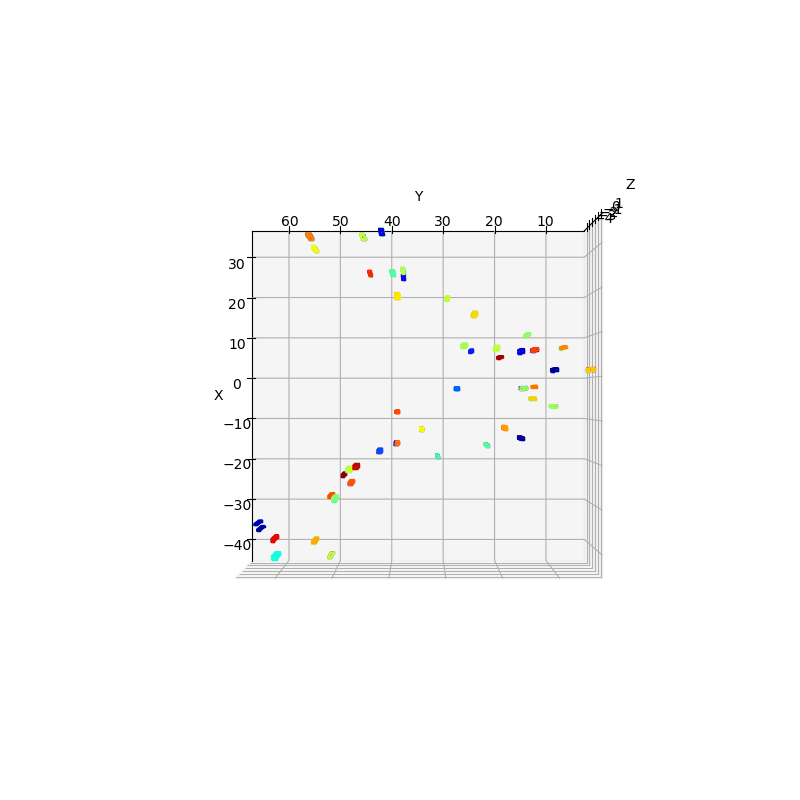

/home/yju/yju_testing/3d-bbox/visualization/visualize.py:319: MatplotlibDeprecationWarning: 
The `xmin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `left` instead.
  ax.set_xlim(xmin=ax_min[0], xmax=ax_max[0])
/home/yju/yju_testing/3d-bbox/visualization/visualize.py:319: MatplotlibDeprecationWarning: 
The `xmax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `right` instead.
  ax.set_xlim(xmin=ax_min[0], xmax=ax_max[0])
/home/yju/yju_testing/3d-bbox/visualization/visualize.py:320: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  ax.set_ylim(ymin=ax_min[1], ymax=ax_max[1])
/home/yju/yju_testing/3d-bbox/visualization/visualize.py:320: MatplotlibDeprecationWarning: 
The `ymax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `top` instead.
  ax.set_ylim(ymin=ax_min[1], ymax=ax_max[1])
/home/yju/yju_testing/3d-bbox/visualiz

In [42]:
num_peds = 100
c = get_colormap(num_peds) # Get colormap
plot_3d(df, num_peds, c, view='top')